<a href="https://colab.research.google.com/github/Shankar-Hadimani/ai-ml-engineering/blob/master/notebook/02_face_verification_using_resnet_VGGFace.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
### mount the google drive
from google.colab import drive

# mount drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
### install MTCNN and  keras VGGface and application.
### Keras VGGFace is not part of tensorflow but keras alone.
# install
!pip install mtcnn
!pip install keras.VGGFace keras_applications

     |████████████████████████████████| 2.3MB 5.8MB/s 
     |████████████████████████████████| 51kB 2.5MB/s 


In [ ]:
!ls /content/drive/MyDrive/ai-ml-keys/kaggle.json

/content/drive/MyDrive/ai-ml-keys/kaggle.json


In [ ]:
### download datasets from Kaggle, to do so, needs to authenticate with Kaggle first
##  download an API json from kaggle account and copy it onto model accessible location 
# create a directory first
!mkdir -p ~/.kaggle

# copy kaggle API authentication key 
!cp '/content/drive/MyDrive/ai-ml-keys/kaggle.json' ~/.kaggle/

# apply read and execute permission to the owner of keys
!chmod 600 '/root/.kaggle/kaggle.json'

In [ ]:
### list the kaggle datasets
!kaggle datasets list -s faces

ref                                              title                                      size  lastUpdated          downloadCount  
-----------------------------------------------  ----------------------------------------  -----  -------------------  -------------  
kostastokis/simpsons-faces                       Simpsons Faces                            442MB  2018-09-28 17:38:04           4400  
soumikrakshit/anime-faces                        Anime Faces                               441MB  2019-05-16 10:38:47           3059  
selfishgene/youtube-faces-with-facial-keypoints  YouTube Faces With Facial Keypoints          0B  2020-05-25 22:53:33           5470  
andrewmvd/animal-faces                           Animal Faces                              696MB  2020-05-22 06:49:01            640  
dansbecker/5-celebrity-faces-dataset             5 Celebrity Faces Dataset                   5MB  2017-11-10 04:08:41           8482  
jessicali9530/celeba-dataset                     CelebF

In [ ]:
### download 5 celebrity faces dataset.
## this is trained with 9000 unique celebrity over 3 million pictures
!kaggle datasets download -d dansbecker/5-celebrity-faces-dataset 

Invalid dataset specification /content/drive/MyDrive/ai-ml-datasets/


In [ ]:
## move dataset onto different directory for easy house keeping in future
!mv 5-celebrity-faces-dataset.zip /content/drive/MyDrive/ai-ml-datasets/

In [ ]:
### unzip the zipped dataset
!unzip /content/drive/MyDrive/ai-ml-datasets/5-celebrity-faces-dataset.zip

Archive:  /content/drive/MyDrive/ai-ml-datasets/5-celebrity-faces-dataset.zip
  inflating: data/train/ben_afflek/httpcsvkmeuaeccjpg.jpg  
  inflating: data/train/ben_afflek/httpimagesfandangocomrImageRendererredesignstaticimgnoxportraitjpgpcpcpcimagesmasterrepositoryperformerimagespjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxdbbdbbbececacdecdcdfjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxdfdfadcfeabjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxedaedabcbefbcbabbjpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxeebdfdbaaajpg.jpg  
  inflating: data/train/ben_afflek/httpssmediacacheakpinimgcomxeeedcacddeccccacfjpg.jpg  
  inflating: data/train/ben_afflek/httpsuploadwikimediaorgwikipediacommonsthumbddBenAffleckbyGageSkidmorejpgpxBenAffleckbyGageSkidmorejpg.jpg  
  inflating: data/train/ben_afflek/httptrwebimgacstanetcxbdddmediasnmediajpg.jpg  
  inflating: data/train/ben_afflek/httpw

In [ ]:
### import the libraries
# mtcnn, input processing module, VGGFace model and cosine similarity rather eucledian distance 
from mtcnn.mtcnn import MTCNN
from keras_vggface.utils import preprocess_input
from keras_vggface.vggface import VGGFace
from scipy.spatial.distance import cosine 
import numpy as np
import pandas as pd
import cv2


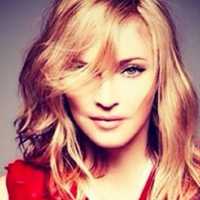

In [ ]:
### read an image
image = cv2.imread('train/madonna/httpwwwetonlinecomphotomadonnabdayjpg.jpg')

## view the image, which has been read above
from google.colab.patches import cv2_imshow

### view the image now
cv2_imshow(image)

In [ ]:
### detect the face, before verification
### face detection is the first step for any image verification 
detector = MTCNN()

faces = detector.detect_faces(image)

### view the co-ordinates for the image
for face in faces:
  print(face)

{'box': [61, 21, 97, 124], 'confidence': 0.9926528930664062, 'keypoints': {'left_eye': (85, 69), 'right_eye': (131, 71), 'nose': (106, 102), 'mouth_left': (87, 117), 'mouth_right': (127, 119)}}


In [ ]:
### create a rectangle(/bounding box) the face from image with color Orange i.e (0, 155, 255)
## also, mark circles on nose, eyes and left and right ends of mouth with color GREEN i.e (0, 155, 100)

def create_bbox(image):
  faces = detector.detect_faces(image)
  bounding_box = faces[0]['box']
  keypoints = faces[0]['keypoints']

  cv2.rectangle(img=image,
                pt1=(bounding_box[0],bounding_box[1]),
                pt2=(bounding_box[0]+bounding_box[2], bounding_box[1]+bounding_box[3]),
                color=(0, 155,255),
                thickness=2
                )
  
  cv2.circle(img=image,center=keypoints['left_eye'],radius=2, color=(0,155,100),thickness=2)
  cv2.circle(img=image,center=keypoints['right_eye'],radius=2, color=(0,155,100),thickness=2)
  cv2.circle(img=image,center=keypoints['nose'],radius=2, color=(0,155,100),thickness=2)
  cv2.circle(img=image,center=keypoints['mouth_left'],radius=2, color=(0,155,100),thickness=2)
  cv2.circle(img=image,center=keypoints['mouth_right'],radius=2, color=(0,155,100),thickness=2)

  return image

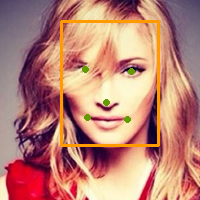

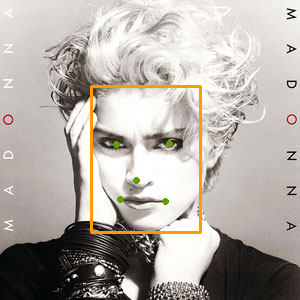

In [ ]:
### test the face detection function
cv2_imshow(create_bbox(cv2.imread('train/madonna/httpwwwetonlinecomphotomadonnabdayjpg.jpg')))

### test another image of same person.. for testing
cv2_imshow(create_bbox(cv2.imread('val/madonna/httpassetsrollingstonecomassetsimagesalbumreviewaffaceabdcccaeedjpg.jpg')))

In [ ]:
### for verification of face, just extract only the  face space from the image


def extract_face(image_loc, resize=(224,224)):
  """
  reason for resizing to  (224, 224) is that, VGG models are 
  developed on the images which are of size 224 X 224 sizes.
  """

  # read image
  image = cv2.imread(image_loc)

  # detect the face fromt he image
  faces = detector.detect_faces(image)

  # draw out co-ordinates of the rectangle for the face
  x1, y1, width, height = faces[0]['box']
  x2, y2 = x1 + width,  y1 + height

  # extract the face from the above boundaries for the face
  face_boundary = image[y1:y2, x1:x2]

  # resize the extracted image to 224x224 size for VGG model
  face_image = cv2.resize(face_boundary, resize)

  return face_image

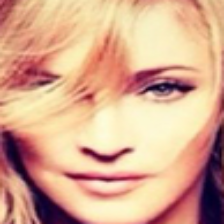

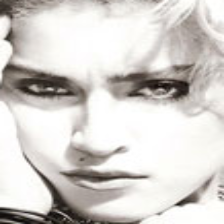

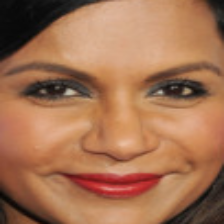

In [ ]:
### test the extraction of the face only image, for both the shown images
### extract face #1
cv2_imshow(extract_face('train/madonna/httpwwwetonlinecomphotomadonnabdayjpg.jpg', (224, 224)))

### extract face #2
cv2_imshow(extract_face('val/madonna/httpassetsrollingstonecomassetsimagesalbumreviewaffaceabdcccaeedjpg.jpg',(224,224)))

### extract totally new person face , extract #3
cv2_imshow(extract_face('train/mindy_kaling/httppixelnymagcomimgsfashiondailymindykalingwhjpg.jpg',(224,224)))

In [ ]:
### extract features from th eface, to do so 
# extract image-embedding layer from the VGG model from our required images.

def get_embedding(faces):
  """
  VGG model is trained with 3.3 million images for 9K celebritires. 
  using the sam emodel but extracting only the embeddign layer from the model

  input:  etxracted face only image
  return: embedding vector of 2048 size.
  """
  face = np.asarray(faces, 'float32')

  # pick the version as 2, as model with ''resnet50' used in this version.
  # version 1 has VGG16 model. since latest version is resent50, so the version 2
  face = preprocess_input(face, version=2)

  ### size as  224x224 with channel 3.
  model = VGGFace(model='resnet50', include_top=False, input_shape=(224, 224, 3), pooling='avg' )

  return model.predict(face)

In [ ]:
### compare the find out the similarity between images.

def get_similarity(faces):
  embeddings = get_embedding(faces)
  score = cosine(embeddings[0], embeddings[1])

  ## print embedding values
  print(embeddings[0])
  print(embeddings[1])

  if score <= 0.5:
    return 'Face Matched: ', score

  return 'Face Not Matched: ', score

***verify the faces now***


In [ ]:
### Let's test the face verification programme
#extract face only images
extracted_face_image = [
         extract_face(image) for image in ['train/madonna/httpwwwetonlinecomphotomadonnabdayjpg.jpg', 
                                           'val/madonna/httpassetsrollingstonecomassetsimagesalbumreviewaffaceabdcccaeedjpg.jpg' ]
]

## find out the similarity
get_similarity(extracted_face_image)

[0.         4.708429   1.2165529  ... 0.33052155 5.5549984  0.1003152 ]
[0.         3.417383   0.         ... 0.63769907 6.987991   0.        ]


('Face Matched: ', 0.4120088219642639)

In [ ]:
#extract face only images
extracted_face_image = [
         extract_face(image) for image in ['train/madonna/httpwwwetonlinecomphotomadonnabdayjpg.jpg', 
                                           'train/mindy_kaling/httppixelnymagcomimgsfashiondailymindykalingwhjpg.jpg' ]
]

## find out the similarity
get_similarity(extracted_face_image)

[0.         4.708429   1.2165529  ... 0.33052155 5.5549984  0.1003152 ]
[0.         7.6351333  0.26703024 ... 0.79060954 0.         0.3412249 ]


('Face Not Matched: ', 0.70253586769104)

--2020-11-23 22:06:07--  https://images.news18.com/ibnlive/uploads/2019/08/PM-MODI.jpg
Resolving images.news18.com (images.news18.com)... 23.0.175.195, 23.0.175.209, 2600:1402:19::1736:a9b1, ...
Connecting to images.news18.com (images.news18.com)|23.0.175.195|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47851 (47K) [image/jpeg]
Saving to: ‘modi_01.jpg’

modi_01.jpg         100%[===================>]  46.73K  --.-KB/s    in 0.001s  

2020-11-23 22:06:08 (35.1 MB/s) - ‘modi_01.jpg’ saved [47851/47851]

--2020-11-23 22:06:08--  https://ichef.bbci.co.uk/news/800/cpsprodpb/FC14/production/_114223546_hi062799634.jpg
Resolving ichef.bbci.co.uk (ichef.bbci.co.uk)... 23.46.247.10, 2600:1402:9800:39a::f33, 2600:1402:9800:384::f33, ...
Connecting to ichef.bbci.co.uk (ichef.bbci.co.uk)|23.46.247.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40820 (40K) [image/jpeg]
Saving to: ‘modi_02.jpg’

modi_02.jpg         100%[===================>]  

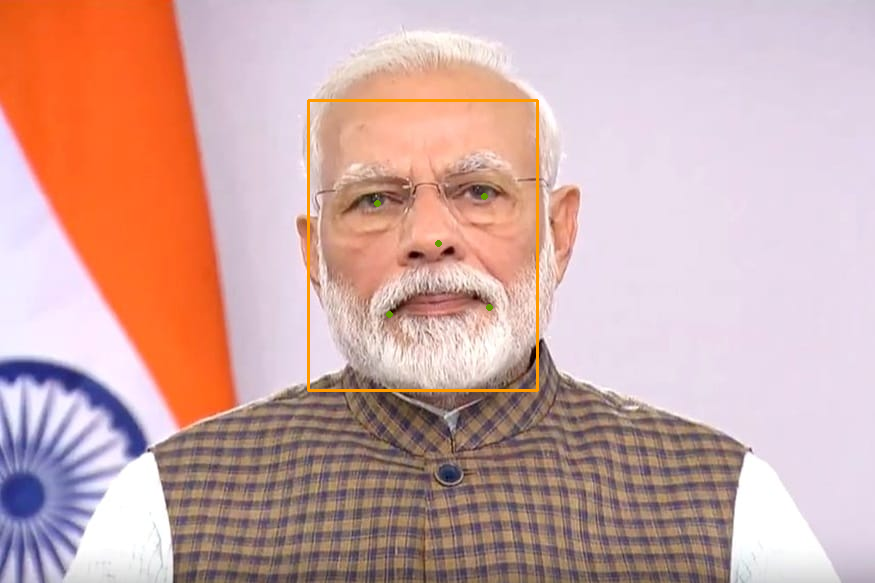

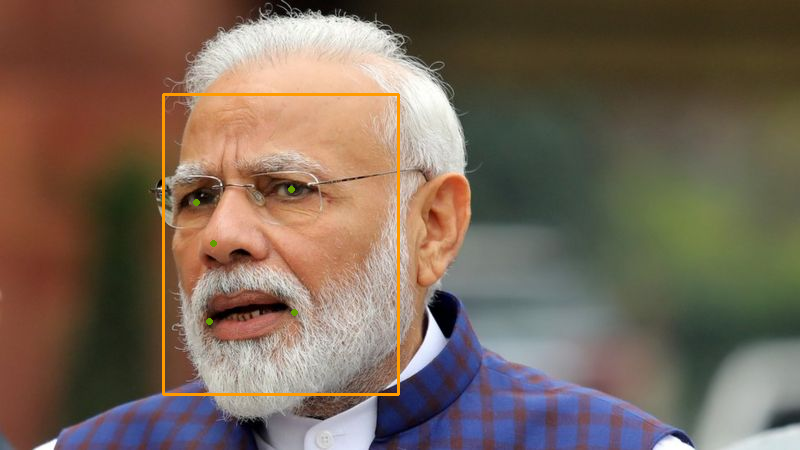

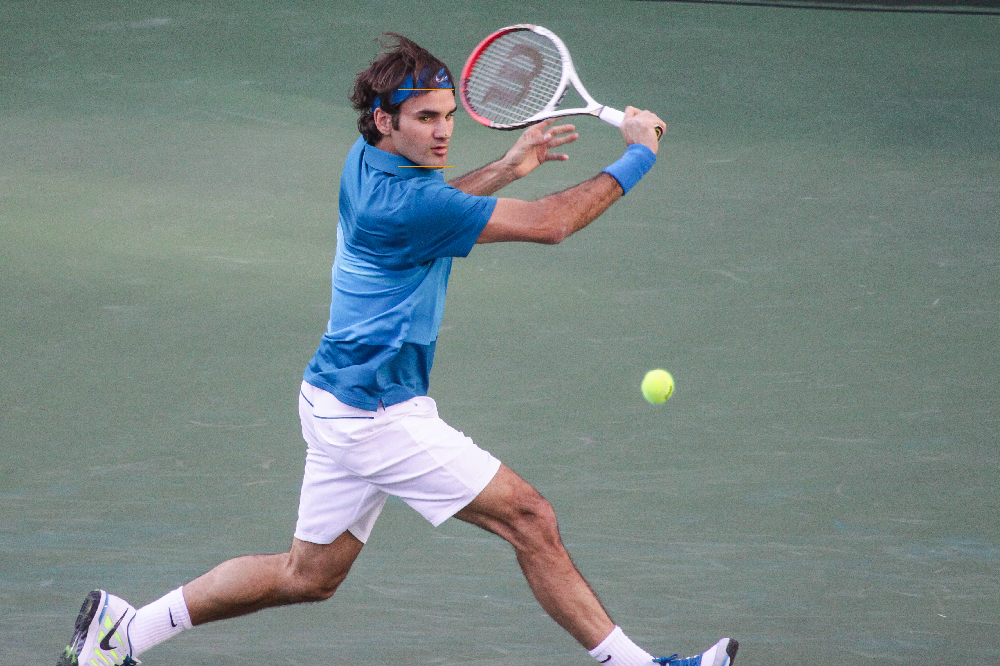

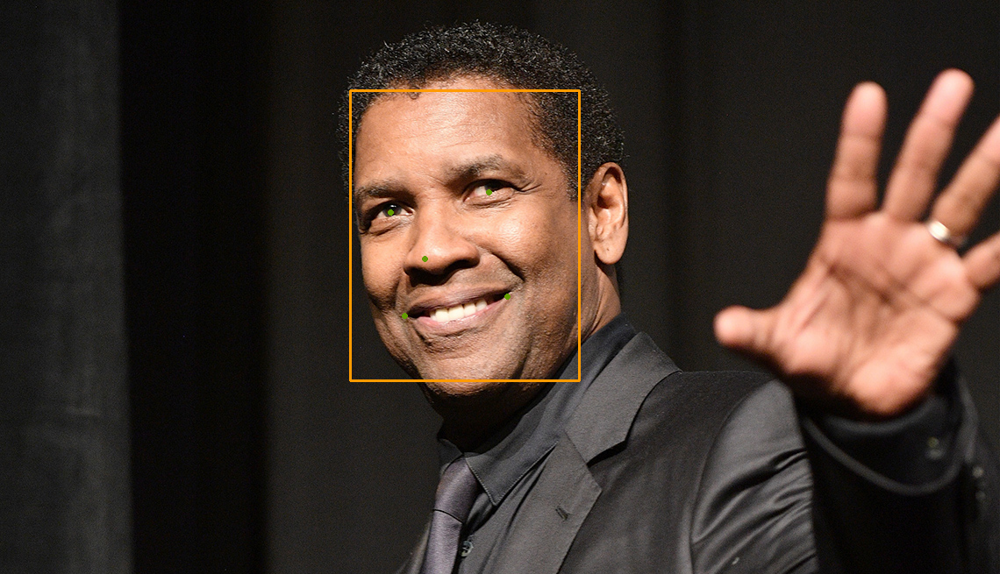

In [ ]:
!wget -O modi_01.jpg https://images.news18.com/ibnlive/uploads/2019/08/PM-MODI.jpg
!wget -O modi_02.jpg https://ichef.bbci.co.uk/news/800/cpsprodpb/FC14/production/_114223546_hi062799634.jpg
!wget -O denzel.jpg https://cdn.aarp.net/content/dam/aarp/entertainment/celebrities/10/1140-denzel-washington-juanita-hubbard.imgcache.revd8044fa337bda995886ad03130962779.jpg
!wget -O federer.jpg https://upload.wikimedia.org/wikipedia/commons/8/8e/Roger_Federer_2012_Indian_Wells.jpg


image_list = ['modi_01.jpg','modi_02.jpg','federer.jpg','denzel.jpg']

# see the downloaded images from the internet
for image in image_list:
  face_image = create_bbox(cv2.imread(image))
  cv2_imshow(face_image)